<a href="https://colab.research.google.com/github/Samjacob007/Advanced-Brain-Tumor-Diagnosis-with-CNNs-A-Multi-Task-Learning-Approach-for-MRI-Image-Classificatio/blob/main/brain_tumor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# New

In [1]:
# Importing necessary libraries and modules
import os
import random
import io
import datetime
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from collections import Counter

# TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import (
    Input,
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense,
    Dropout,
    BatchNormalization,
    LeakyReLU,
    Activation,
)
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import load_model
# OpenCV
import cv2

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle, class_weight, compute_class_weight
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
)


# Google Colab
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Define the project path without spaces in the mount point
save_dir = '/content/drive/MyDrive/project/brain tumor'

Mounted at /content/drive


In [2]:
import os
import cv2
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from collections import Counter
from tqdm import tqdm

# Configuration
base_path = '/content/drive/MyDrive/project/brain tumor'
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
image_size = 224
sample_size = 500  # Define sample_size to fix the error

# Function to load and sample images
def load_and_sample_images(base_path, subset, sample_size):
    data, labels_list = [], []
    for label_idx, label in enumerate(labels):
        subset_path = os.path.join(base_path, subset, label)
        all_files = os.listdir(subset_path)
        sampled_files = random.sample(all_files, min(len(all_files), sample_size))
        for file in tqdm(sampled_files, desc=f"Processing {subset} - {label}"):
            image = cv2.imread(os.path.join(subset_path, file))
            image = cv2.resize(cv2.cvtColor(image, cv2.COLOR_BGR2RGB), (image_size, image_size))
            data.append(image)
            labels_list.append(label_idx)
    return np.array(data), np.array(labels_list)

# Load Training and Testing Data
x_train, y_train = load_and_sample_images(base_path, 'Training', sample_size)
x_test, y_test = load_and_sample_images(base_path, 'Testing', sample_size)

# Normalize Data and One-Hot Encode Labels
x_train, x_test = x_train / 255.0, x_test / 255.0
y_train, y_test = to_categorical(y_train, len(labels)), to_categorical(y_test, len(labels))

# Shuffle Data
x_train, y_train = shuffle(x_train, y_train, random_state=42)

# Single Train-Validation Split
x_train_final, x_val, y_train_final, y_val = train_test_split(
    x_train, y_train, test_size=0.2, random_state=42
)

# Count Class Distribution
def count_class_distribution(y):
    if len(y.shape) > 1 and y.shape[1] > 1:
        y = np.argmax(y, axis=1)  # Convert one-hot to categorical
    return dict(Counter(y))

# Class Distribution Verification
train_class_counts = count_class_distribution(y_train_final)
val_class_counts = count_class_distribution(y_val)
test_class_counts = count_class_distribution(y_test)

print("Training class distribution:", train_class_counts)
print("Validation class distribution:", val_class_counts)
print("Testing class distribution:", test_class_counts)

# Verify Data Shapes
print(f"x_train shape: {x_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"x_test shape: {x_test.shape}")
print(f"y_test shape: {y_test.shape}")



Processing Testing - pituitary: 100%|██████████| 300/300 [00:03<00:00, 87.15it/s] 


Training class distribution: {0: 394, 1: 409, 2: 393, 3: 404}
Validation class distribution: {3: 96, 1: 91, 0: 106, 2: 107}
Testing class distribution: {0: 300, 1: 306, 2: 405, 3: 300}
x_train shape: (2000, 224, 224, 3)
y_train shape: (2000, 4)
x_test shape: (1311, 224, 224, 3)
y_test shape: (1311, 4)


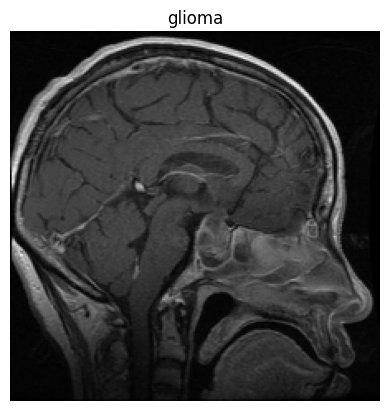

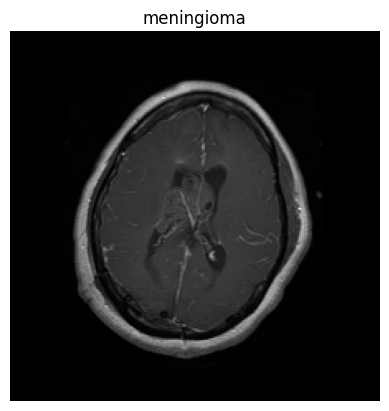

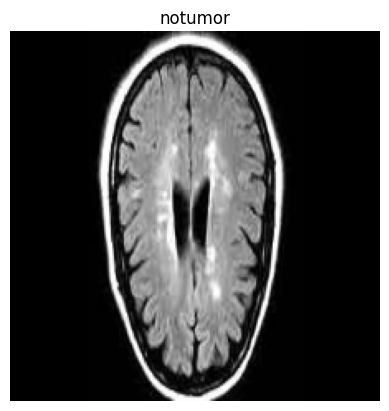

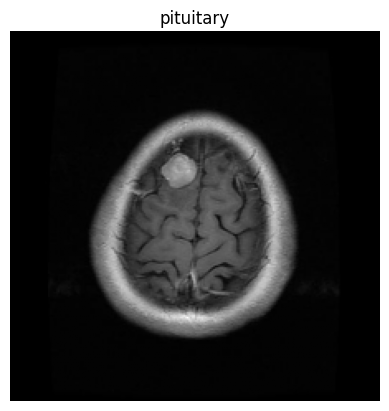

In [3]:
# Display the first image for each class
for i in range(4):
    plt.imshow(x_train[i])
    plt.title(labels[i])
    plt.axis('off')
    plt.show()

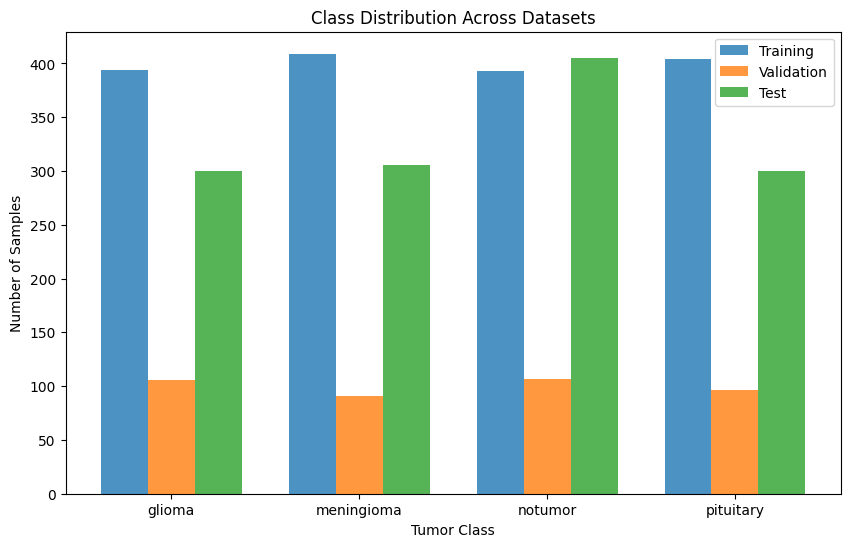

In [4]:
# Sum one-hot encoded labels to get class counts
train_class_counts = np.sum(y_train_final, axis=0)
val_class_counts = np.sum(y_val, axis=0)
test_class_counts = np.sum(y_test, axis=0)  # Replace y_test_classification with y_test

# Class names
class_names = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Plot bar chart
plt.figure(figsize=(10, 6))
bar_width = 0.25
x_indexes = np.arange(len(class_names))

plt.bar(x_indexes, train_class_counts, width=bar_width, label='Training', alpha=0.8)
plt.bar(x_indexes + bar_width, val_class_counts, width=bar_width, label='Validation', alpha=0.8)
plt.bar(x_indexes + 2 * bar_width, test_class_counts, width=bar_width, label='Test', alpha=0.8)

plt.xticks(x_indexes + bar_width, class_names)
plt.title("Class Distribution Across Datasets")
plt.xlabel("Tumor Class")
plt.ylabel("Number of Samples")
plt.legend()
plt.show()



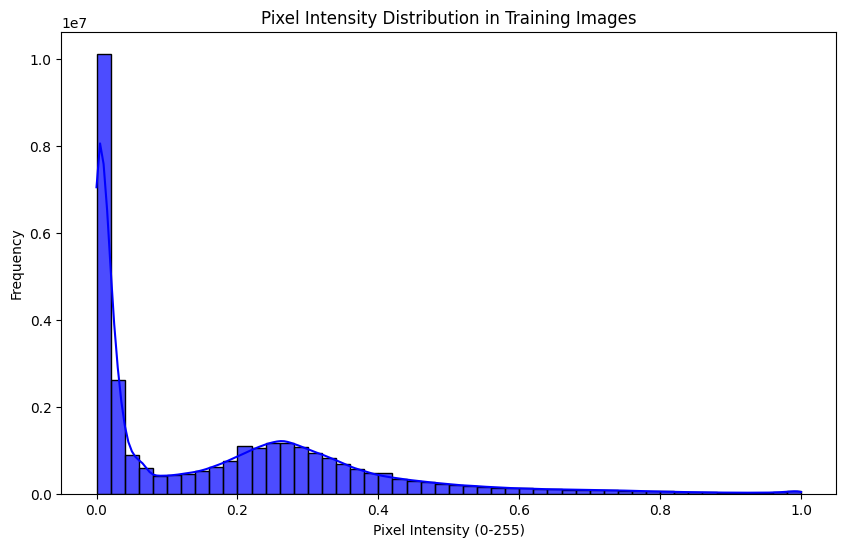

In [5]:


# Flatten pixel values of a random sample from the training set
random_sample = x_train_final[:200]  # Use 200 random images
flattened_pixels = random_sample.reshape(-1)

# Plot histogram of pixel intensities
plt.figure(figsize=(10, 6))
sns.histplot(flattened_pixels, bins=50, kde=True, color='blue', alpha=0.7)
plt.title("Pixel Intensity Distribution in Training Images")
plt.xlabel("Pixel Intensity (0-255)")
plt.ylabel("Frequency")
plt.show()


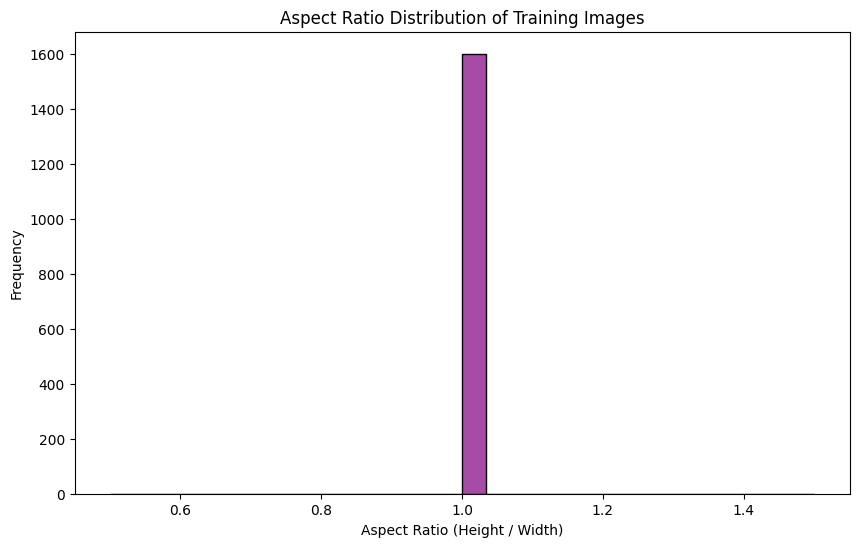

In [6]:
# Extract original image dimensions before resizing
heights = [img.shape[0] for img in x_train_final]
widths = [img.shape[1] for img in x_train_final]

# Calculate aspect ratios
aspect_ratios = np.array(heights) / np.array(widths)

# Plot histogram of aspect ratios
plt.figure(figsize=(10, 6))
sns.histplot(aspect_ratios, bins=30, kde=True, color='purple', alpha=0.7)
plt.title("Aspect Ratio Distribution of Training Images")
plt.xlabel("Aspect Ratio (Height / Width)")
plt.ylabel("Frequency")
plt.show()

In [7]:
datagen = ImageDataGenerator(
    rotation_range=15,  # Reduced rotation
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


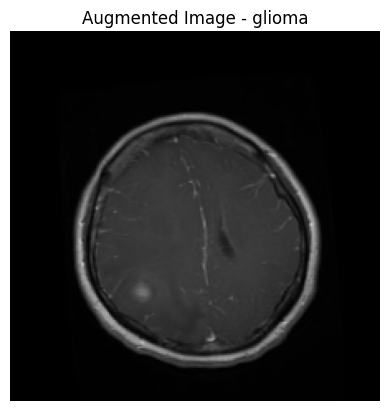

In [8]:
for x_batch, y_batch in datagen.flow(x_train_final, y_train_final, batch_size=4):
    for i in range(4):
        plt.imshow(x_batch[i])
        label = labels[np.argmax(y_batch[i])]
        plt.title(f'Augmented Image - {label}')
        plt.axis('off')
    plt.show()
    break


In [9]:
# Define save path
save_dir = '/content/drive/MyDrive/project/brain tumor'
os.makedirs(save_dir, exist_ok=True)

In [10]:
# Load Pre-Trained VGG16
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

for layer in base_model.layers[:-5]:
    layer.trainable = False


# Add Custom Layers
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
output = Dense(4, activation='softmax')(x)  # 4 classes: glioma, meningioma, notumor, pituitary

# Define Model
vgg_model = Model(inputs=base_model.input, outputs=output)

# Compile Model
vgg_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])
# Display the Model Summary
vgg_model.summary()

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [11]:
# Define Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
   ModelCheckpoint(f'{save_dir}/best_vgg16_model.keras', monitor='val_loss', save_best_only=True)

]

In [12]:
# Train Model
history_vgg = vgg_model.fit(
    datagen.flow(x_train_final, y_train_final, batch_size=32),
    validation_data=(x_val, y_val),
    epochs=30,
    callbacks=callbacks
)

# Save VGG16 model
vgg_model.save(f'{save_dir}/vgg_model.h5')
print(f"VGG16 Model saved to {save_dir}/vgg_model.h5")

Epoch 1/30
50/50 [==============================] - 54s 1s/step - loss: 4.7070 - accuracy: 0.6625 - precision: 0.7379 - recall: 0.5700 - val_loss: 3.3022 - val_accuracy: 0.8550 - val_precision: 0.8670 - val_recall: 0.8150 - lr: 1.0000e-04
Epoch 2/30
50/50 [==============================] - 51s 1s/step - loss: 2.8119 - accuracy: 0.8288 - precision: 0.8531 - recall: 0.8056 - val_loss: 2.2537 - val_accuracy: 0.8950 - val_precision: 0.9098 - val_recall: 0.8825 - lr: 1.0000e-04
Epoch 3/30
50/50 [==============================] - 50s 1s/step - loss: 2.0202 - accuracy: 0.8587 - precision: 0.8694 - recall: 0.8406 - val_loss: 1.7446 - val_accuracy: 0.8875 - val_precision: 0.9119 - val_recall: 0.8800 - lr: 1.0000e-04
Epoch 4/30
50/50 [==============================] - 51s 1s/step - loss: 1.6127 - accuracy: 0.8888 - precision: 0.9052 - recall: 0.8712 - val_loss: 1.4958 - val_accuracy: 0.9025 - val_precision: 0.9109 - val_recall: 0.8950 - lr: 1.0000e-04
Epoch 5/30
50/50 [==========================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


VGG16 Model saved to /content/drive/MyDrive/project/brain tumor/vgg_model.h5


In [13]:
# Define the path to the saved model
model_path = '/content/drive/MyDrive/project/brain tumor/vgg_model.h5'

# Load the model
vgg_model = load_model(model_path)
print("Model loaded successfully!")



Model loaded successfully!


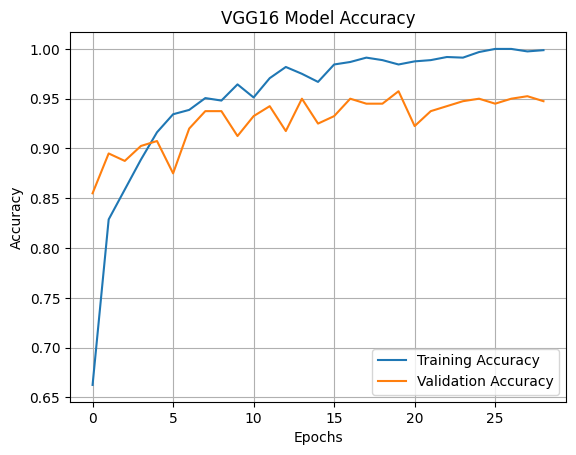

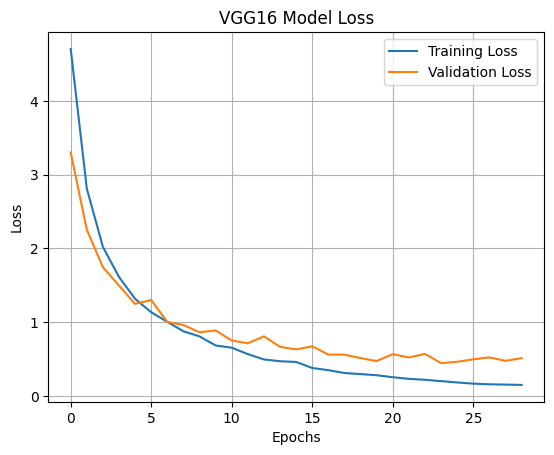

In [14]:
# Plot training and validation accuracy
plt.plot(history_vgg.history['accuracy'], label='Training Accuracy')
plt.plot(history_vgg.history['val_accuracy'], label='Validation Accuracy')
plt.title("VGG16 Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()



# Plot training and validation loss
plt.plot(history_vgg.history['loss'], label='Training Loss')
plt.plot(history_vgg.history['val_loss'], label='Validation Loss')
plt.title("VGG16 Model Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

50/50 [==============================] - 29s 577ms/step


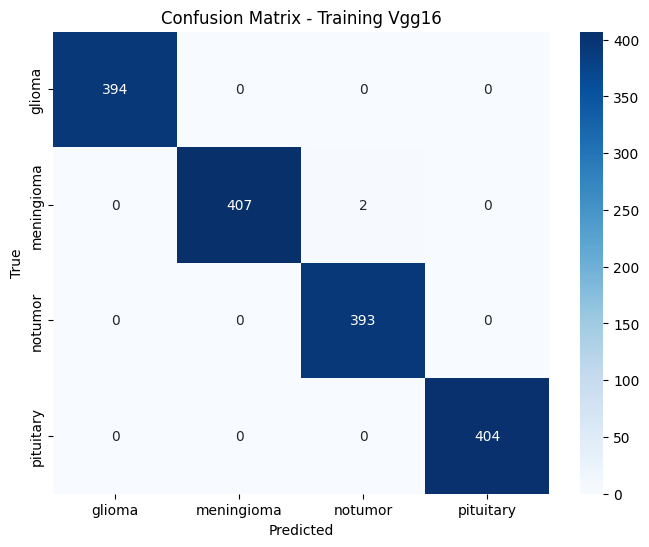

In [15]:
# Get predictions for the training set
y_pred_train = np.argmax(vgg_model.predict(x_train_final), axis=1)
y_true_train = np.argmax(y_train_final, axis=1)

# Generate the confusion matrix
cm_train = confusion_matrix(y_true_train, y_pred_train)

# Plot confusion matrix for the training set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix - Training Vgg16")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

41/41 [==============================] - 24s 573ms/step

Classification Report:
               precision    recall  f1-score   support

      glioma       0.97      0.89      0.93       300
  meningioma       0.92      0.88      0.90       306
     notumor       0.94      0.99      0.97       405
   pituitary       0.92      0.99      0.95       300

    accuracy                           0.94      1311
   macro avg       0.94      0.94      0.94      1311
weighted avg       0.94      0.94      0.94      1311



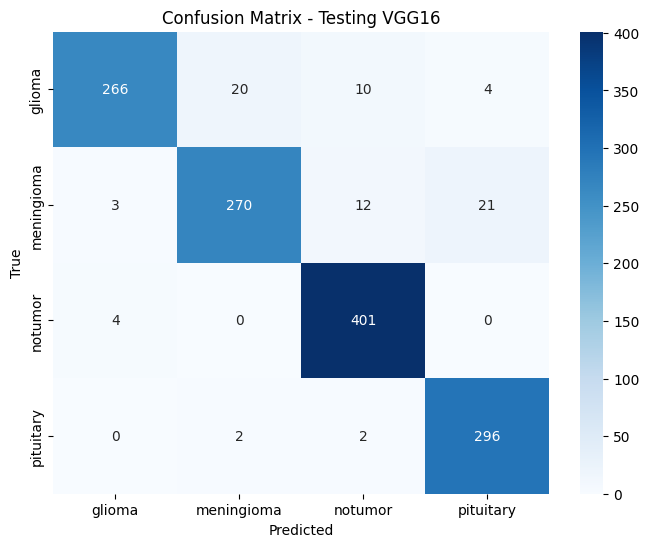

In [16]:
# Predictions
y_pred_vgg = np.argmax(vgg_model.predict(x_test), axis=1)
y_true = np.argmax(y_test, axis=1)  # Replace y_test_classification with y_test

# Classification report
print("\nClassification Report:\n", classification_report(y_true, y_pred_vgg, target_names=labels))

# Confusion matrix
cm_vgg = confusion_matrix(y_true, y_pred_vgg)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_vgg, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix - Testing VGG16")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


41/41 [==============================] - 24s 574ms/step


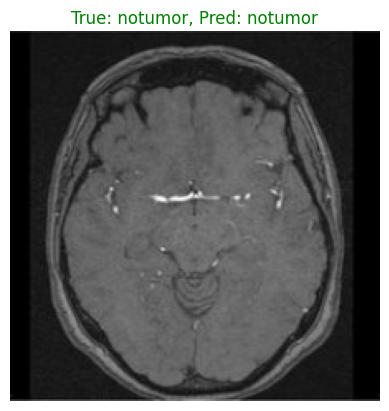

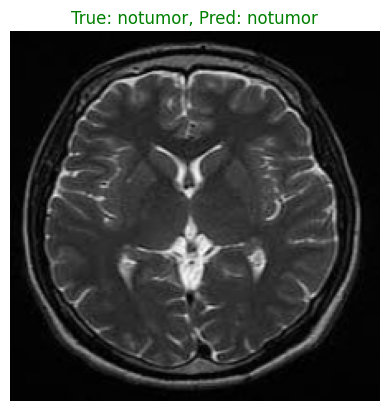

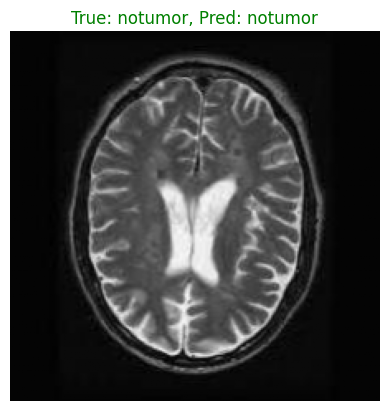

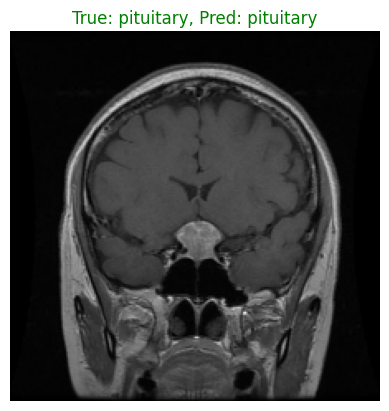

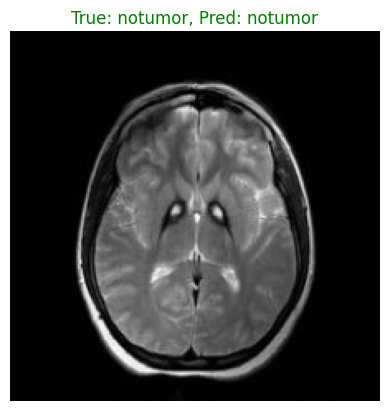

In [17]:
# Predictions
y_pred = np.argmax(vgg_model.predict(x_test), axis=1)  # Get class indices for predictions

# Display 5 random images with predictions
for i in range(5):  # Display 5 random images
    idx = random.randint(0, len(x_test) - 1)  # Select a random index
    plt.imshow(x_test[idx])  # Display the corresponding image
    true_label = labels[np.argmax(y_test[idx])]  # Replace y_test_classification with y_test
    predicted_label = labels[y_pred[idx]]  # Predicted label
    color = 'green' if true_label == predicted_label else 'red'  # Highlight correct/incorrect
    plt.title(f"True: {true_label}, Pred: {predicted_label}", color=color)
    plt.axis('off')  # Hide axes
    plt.show()  # Display the image



Generating Grad-CAM for class: glioma

1/1 [==============================] - 0s 79ms/step


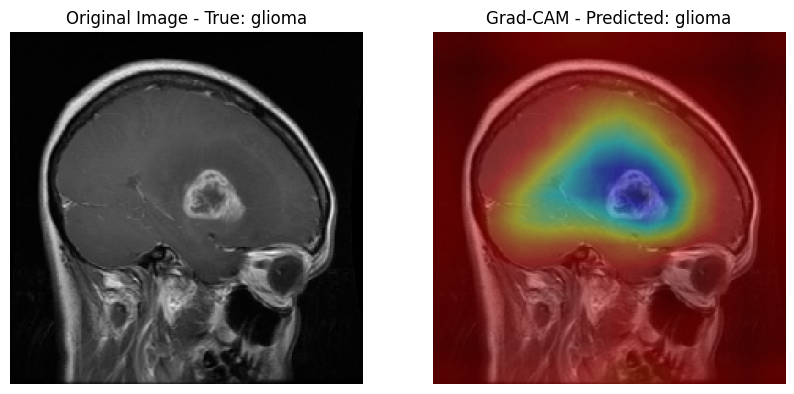

1/1 [==============================] - 0s 83ms/step


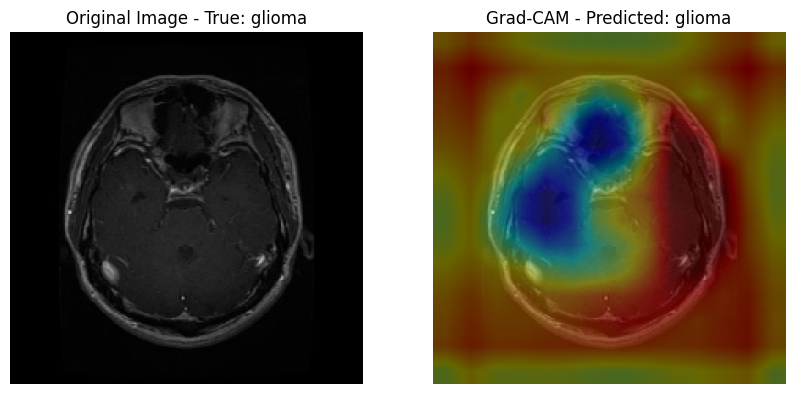

1/1 [==============================] - 0s 75ms/step


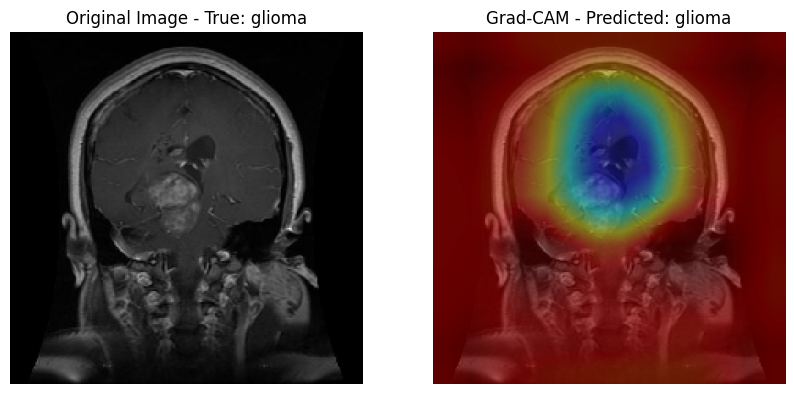


Generating Grad-CAM for class: meningioma

1/1 [==============================] - 0s 76ms/step


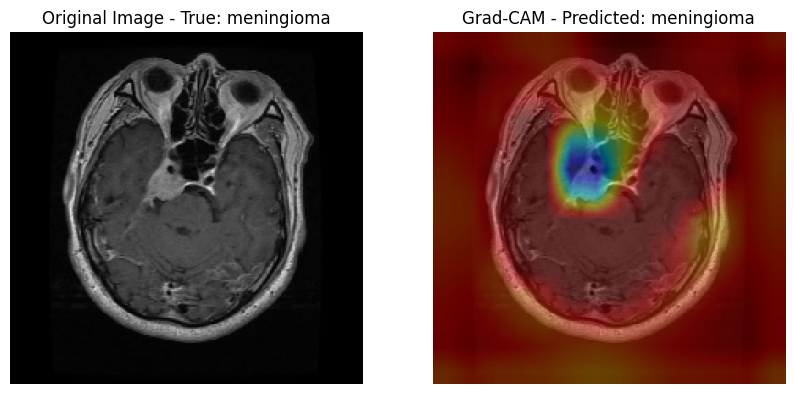

1/1 [==============================] - 0s 77ms/step


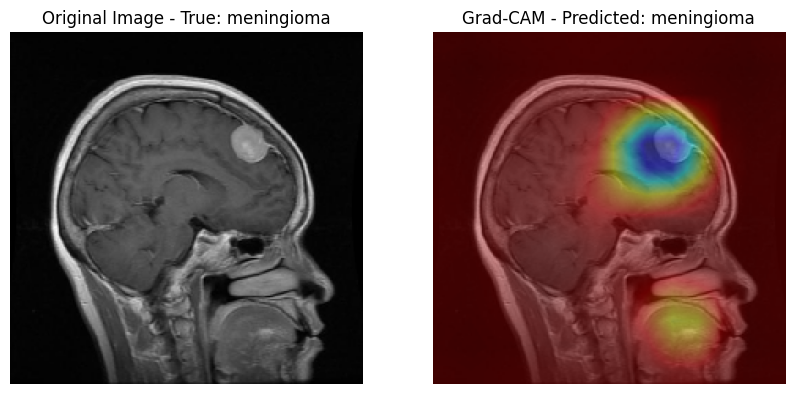

1/1 [==============================] - 0s 75ms/step


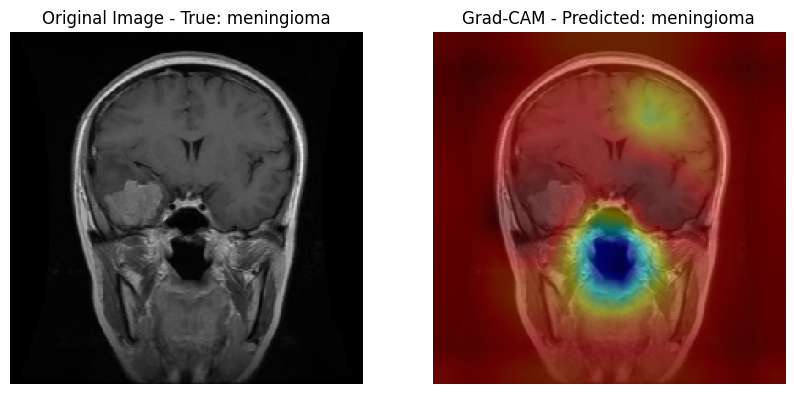


Generating Grad-CAM for class: notumor

1/1 [==============================] - 0s 88ms/step


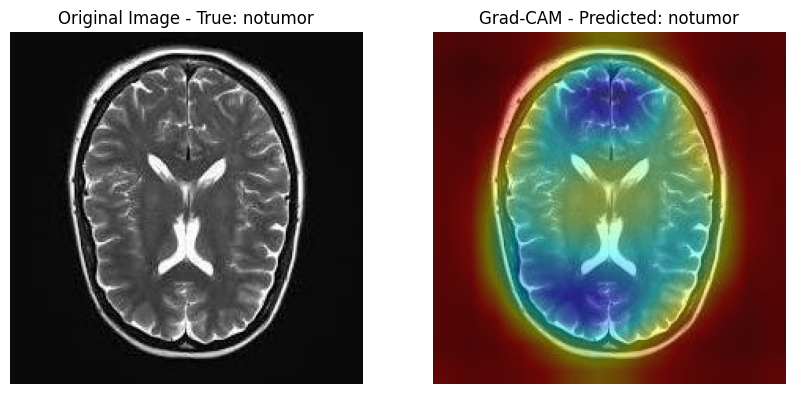

1/1 [==============================] - 0s 78ms/step


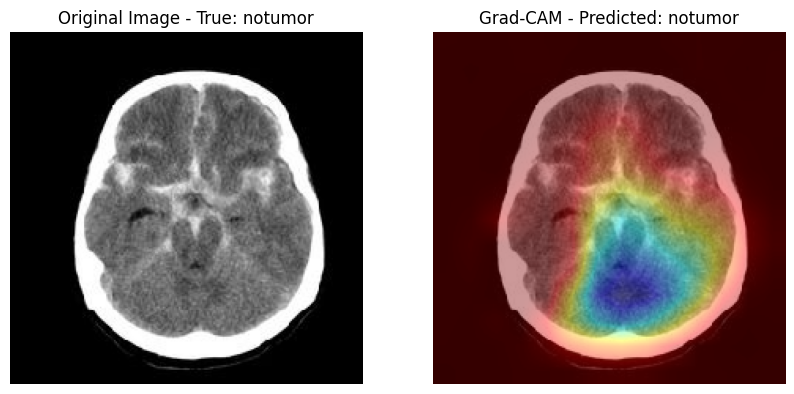

1/1 [==============================] - 0s 86ms/step


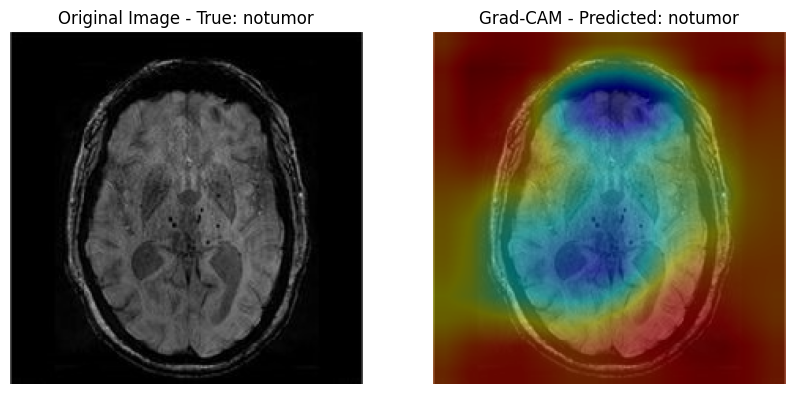


Generating Grad-CAM for class: pituitary

1/1 [==============================] - 0s 76ms/step


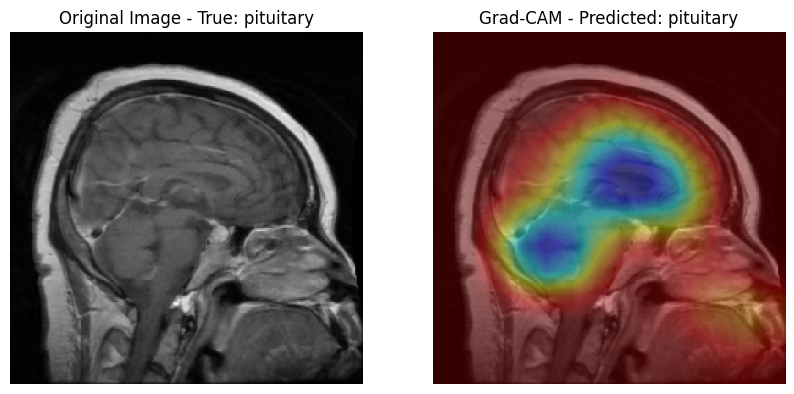

1/1 [==============================] - 0s 78ms/step


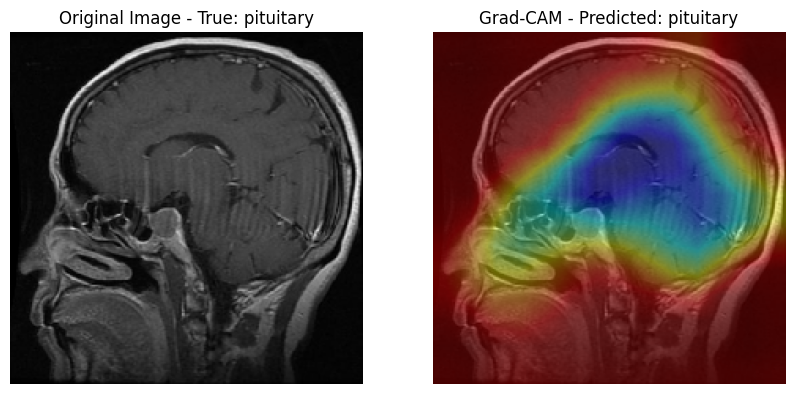

1/1 [==============================] - 0s 75ms/step


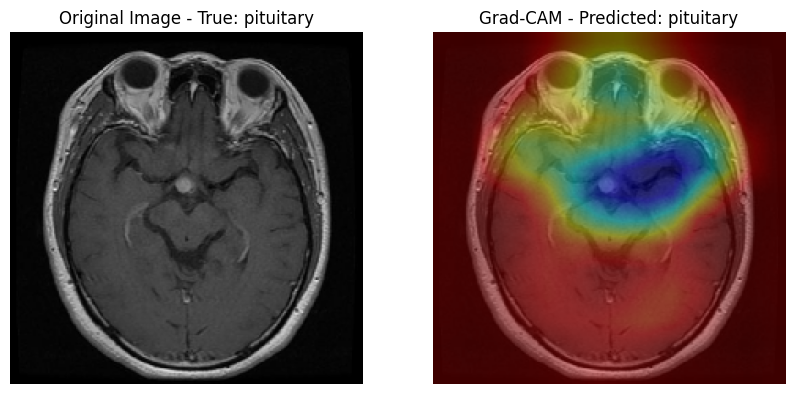

In [18]:
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']
# Function to fetch random images from each class
def fetch_images(base_path, data_folder, class_labels, num_samples=3):
    images_by_class = {}
    for label in class_labels:
        folder_path = os.path.join(base_path, data_folder, label)
        all_files = os.listdir(folder_path)
        sampled_files = random.sample(all_files, min(len(all_files), num_samples))  # Randomly sample
        images_by_class[label] = [os.path.join(folder_path, f) for f in sampled_files]
    return images_by_class

# Fetch images dynamically
sample_image_paths = fetch_images(base_path, 'Testing', class_labels)

# Function to generate Grad-CAM heatmap for the given model and image
def grad_cam(model, image, last_conv_layer_name, class_idx=None):
    """
    Generate Grad-CAM heatmap for a given model and image.
    """
    # Get the last convolutional layer
    grad_model = Model([model.input], [model.get_layer(last_conv_layer_name).output, model.output])

    # Expand image dimensions for processing
    image_expanded = np.expand_dims(image, axis=0)

    # Forward pass and compute gradients
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_expanded)
        if class_idx is None:
            class_idx = np.argmax(predictions[0])  # Use predicted class if none specified
        loss = predictions[:, class_idx]

    # Compute gradients of loss w.r.t. the convolutional layer output
    grads = tape.gradient(loss, conv_outputs)

    # Compute mean intensity of gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel by corresponding gradient intensity
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize heatmap values to [0, 1]
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Function to overlay heatmap on original image
def overlay_heatmap(image, heatmap, alpha=0.6, colormap=cv2.COLORMAP_JET):
    """
    Overlay heatmap on the original image.
    """
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, colormap)
    overlaid_image = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
    return overlaid_image

# Function to visualize Grad-CAM on images
def visualize_gradcam(img_path, model, class_labels, layer_name='block5_conv3'):
    """
    Generate Grad-CAM visualization for a single image.
    """
    # Load and preprocess the image
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array /= 255.0  # Normalize pixel values

    # Apply Grad-CAM
    heatmap = grad_cam(model, img_array, last_conv_layer_name=layer_name)

    # Overlay heatmap on the image
    img_rgb = (img_array * 255).astype(np.uint8)  # Convert to RGB format
    overlay_img = overlay_heatmap(img_rgb, heatmap)

    # Display the original image and overlayed image
    pred_class_idx = np.argmax(model.predict(np.expand_dims(img_array, axis=0)))
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title(f"Original Image - True: {class_labels[pred_class_idx]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay_img)
    plt.title(f"Grad-CAM - Predicted: {class_labels[pred_class_idx]}")
    plt.axis('off')
    plt.show()

# Loop through the fetched images and generate Grad-CAM visualizations
for label, paths in sample_image_paths.items():
    print(f"\nGenerating Grad-CAM for class: {label}\n")
    for img_path in paths:
        visualize_gradcam(img_path, vgg_model, class_labels, layer_name='block5_conv3')


In [19]:
# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=10,  # Reduced rotation
    width_shift_range=0.05,  # Less horizontal shift
    height_shift_range=0.05,
    shear_range=0.05,
    zoom_range=0.05,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen.fit(x_train_final)

In [20]:
# Load Pretrained ResNet50 Model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Fine-Tuning: Unfreeze the Last 20 Layers
for layer in base_model.layers[:-20]:  # Freeze all but last 20 layers
    layer.trainable = False


# Custom Top Layers
x = base_model.output
x = Flatten()(x)
x = Dense(256, kernel_regularizer=l2(0.01))(x)
x = BatchNormalization()(x)
x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
x = Dropout(0.3)(x)  # Increased dropout
 # Adjusted Dropout
output = Dense(4, activation='softmax')(x)  # 4 classes: glioma, meningioma, notumor, pituitary

# Define Model
resnet_model = Model(inputs=base_model.input, outputs=output)

# Compile Model
resnet_model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)
resnet_model.summary()



94765736/94765736 [==============================] - 0s 0us/step
Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_2[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                      

In [21]:
# Callbacks
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-8),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ModelCheckpoint(f'{save_dir}/best_resnet50_model.h5', monitor='val_loss', save_best_only=True)
]

In [22]:
# Updated epochs with early stopping
history_resnet = resnet_model.fit(
    datagen.flow(x_train_final, y_train_final, batch_size=32),
    validation_data=(x_val, y_val),
    epochs=40,
    callbacks=callbacks
)



# Save model to the Google Drive folder
resnet_model.save(f'{save_dir}/resnet_model.h5')
print(f"Model saved to {save_dir}/resnet_model.h5")

Epoch 1/40
50/50 [==============================] - ETA: 0s - loss: 4.9854 - accuracy: 0.6450 - precision_1: 0.6795 - recall_1: 0.5856

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


50/50 [==============================] - 54s 986ms/step - loss: 4.9854 - accuracy: 0.6450 - precision_1: 0.6795 - recall_1: 0.5856 - val_loss: 6.0339 - val_accuracy: 0.2500 - val_precision_1: 0.2494 - val_recall_1: 0.2475 - lr: 1.0000e-04
Epoch 2/40
50/50 [==============================] - 50s 997ms/step - loss: 3.6059 - accuracy: 0.7262 - precision_1: 0.7577 - recall_1: 0.6762 - val_loss: 4.4454 - val_accuracy: 0.2500 - val_precision_1: 0.2468 - val_recall_1: 0.2425 - lr: 1.0000e-04
Epoch 3/40
50/50 [==============================] - 50s 1s/step - loss: 2.9771 - accuracy: 0.7394 - precision_1: 0.7736 - recall_1: 0.7025 - val_loss: 3.4856 - val_accuracy: 0.4350 - val_precision_1: 0.5976 - val_recall_1: 0.2450 - lr: 1.0000e-04
Epoch 4/40
50/50 [==============================] - 49s 984ms/step - loss: 2.5586 - accuracy: 0.7500 - precision_1: 0.7762 - recall_1: 0.7044 - val_loss: 3.0008 - val_accuracy: 0.4200 - val_precision_1: 0.6209 - val_recall_1: 0.3275 - lr: 1.0000e-04
Epoch 5/40
50/

In [23]:
# Define the path to the saved ResNet50 model
model_path = '/content/drive/MyDrive/project/brain tumor/resnet_model.h5'

# Load the model
resnet_model = load_model(model_path)
print("ResNet50 model loaded successfully!")

ResNet50 model loaded successfully!


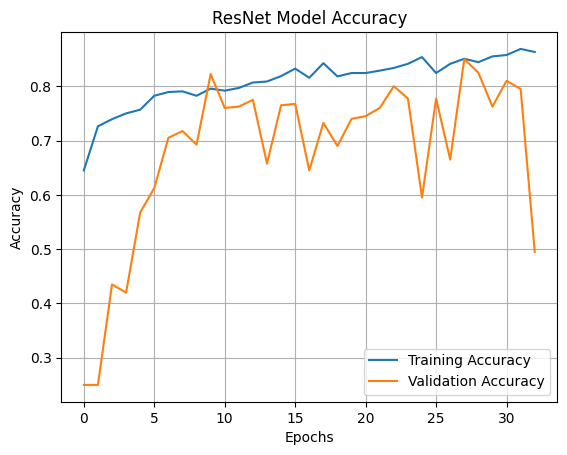

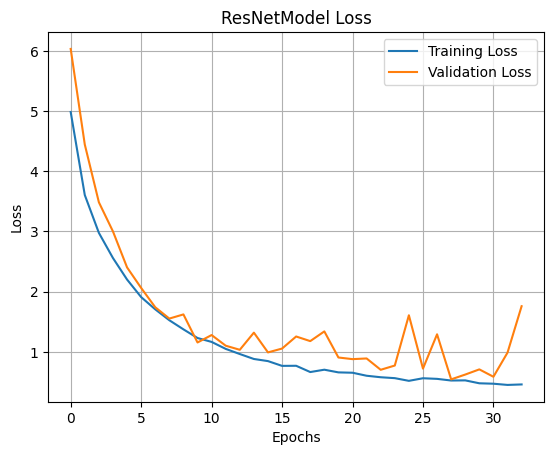

In [24]:
# Plot training and validation accuracy for ResNet50
plt.plot(history_resnet.history['accuracy'], label='Training Accuracy')
plt.plot(history_resnet.history['val_accuracy'], label='Validation Accuracy')
plt.title("ResNet Model Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot training and validation loss for ResNet50
plt.plot(history_resnet.history['loss'], label='Training Loss')
plt.plot(history_resnet.history['val_loss'], label='Validation Loss')
plt.title("ResNetModel Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()


50/50 [==============================] - 29s 558ms/step


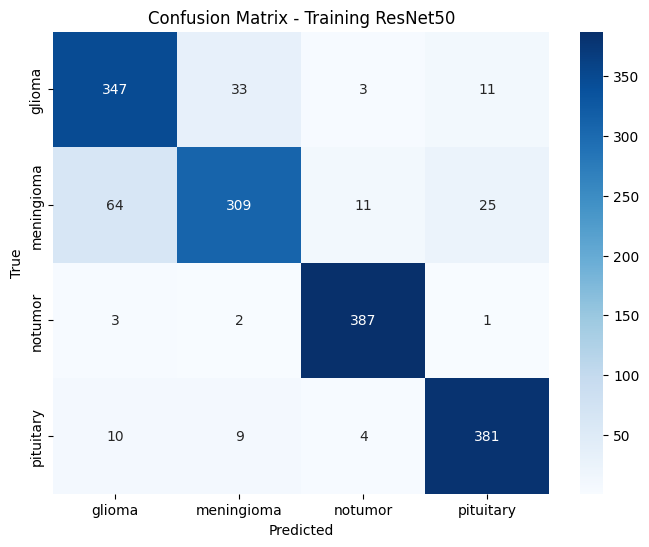

In [25]:
# Get predictions for the training set
y_pred_train_resnet = np.argmax(resnet_model.predict(x_train_final), axis=1)
y_true_train_resnet = np.argmax(y_train_final, axis=1)

# Generate the confusion matrix for ResNet50
cm_train_resnet = confusion_matrix(y_true_train_resnet, y_pred_train_resnet)

# Plot confusion matrix for the training set
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train_resnet, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix - Training ResNet50")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


41/41 [==============================] - 24s 562ms/step

Classification Report - ResNet50:
               precision    recall  f1-score   support

      glioma       0.77      0.71      0.74       300
  meningioma       0.70      0.58      0.63       306
     notumor       0.85      0.96      0.90       405
   pituitary       0.83      0.91      0.87       300

    accuracy                           0.80      1311
   macro avg       0.79      0.79      0.79      1311
weighted avg       0.79      0.80      0.79      1311



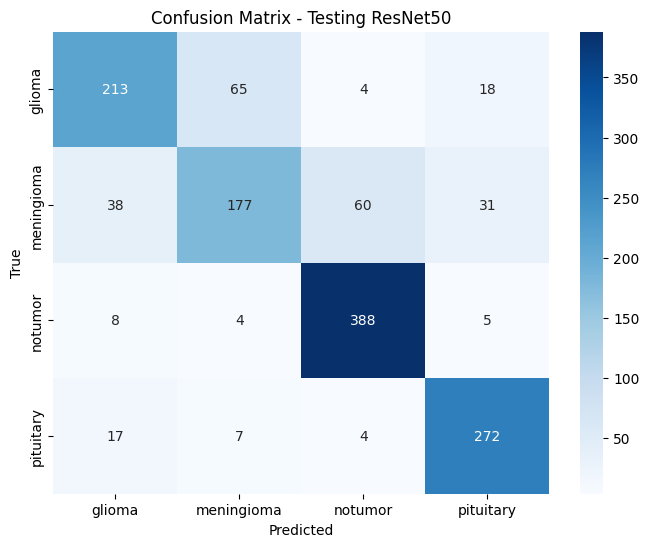

In [26]:
# Predictions for ResNet50
y_pred_resnet = np.argmax(resnet_model.predict(x_test), axis=1)
y_true_resnet = np.argmax(y_test, axis=1)  # Replace y_test_classification with y_test

# Classification report for ResNet50
print("\nClassification Report - ResNet50:\n", classification_report(y_true_resnet, y_pred_resnet, target_names=labels))

# Confusion matrix for ResNet50
cm_resnet = confusion_matrix(y_true_resnet, y_pred_resnet)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_resnet, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix - Testing ResNet50")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


41/41 [==============================] - 23s 549ms/step


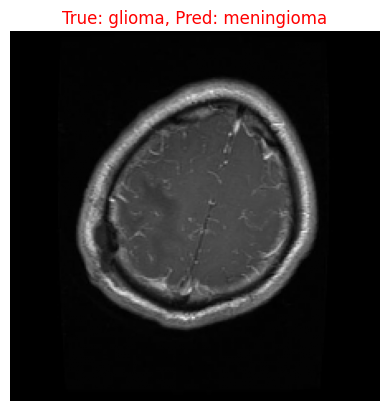

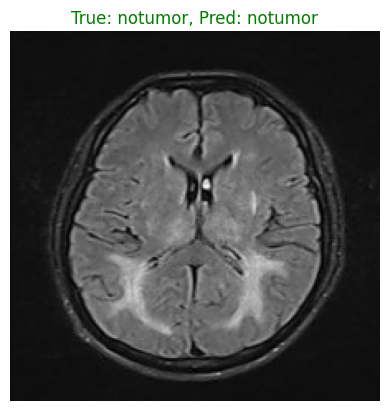

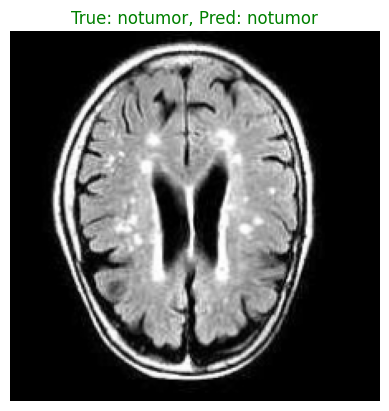

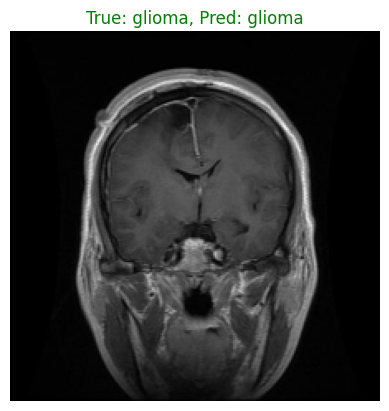

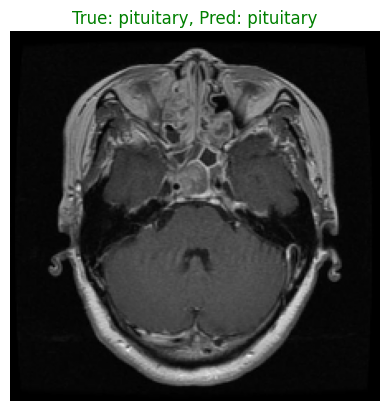

In [27]:
# Get predictions for the test set
resnet_predictions = np.argmax(resnet_model.predict(x_test), axis=1)  # Predictions for x_test

# Display 5 random images with true and predicted labels
for i in range(5):
    idx = random.randint(0, len(x_test) - 1)  # Select a random index
    plt.imshow(x_test[idx])  # Display the image

    # Correct the true label reference
    true_label = labels[np.argmax(y_test[idx])]  # Replace y_test_classification with y_test

    predicted_label = labels[resnet_predictions[idx]]  # Predicted label
    color = 'green' if true_label == predicted_label else 'red'  # Correct = green, Incorrect = red

    plt.title(f"True: {true_label}, Pred: {predicted_label}", color=color)
    plt.axis('off')  # Hide axes
    plt.show()  # Display the image




Generating Grad-CAM for class: glioma

1/1 [==============================] - 0s 97ms/step


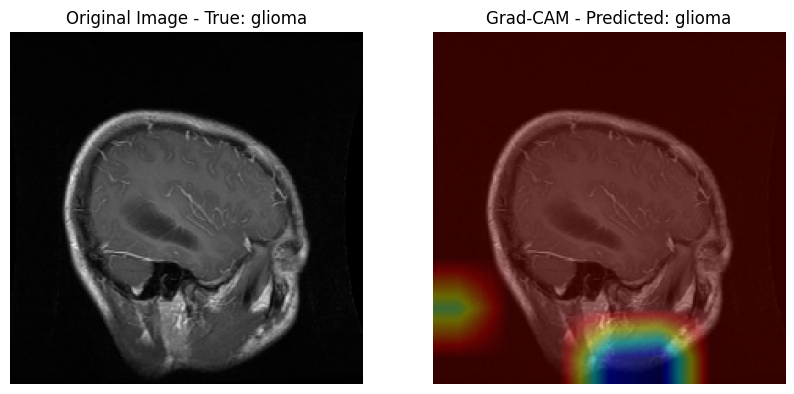

1/1 [==============================] - 0s 95ms/step


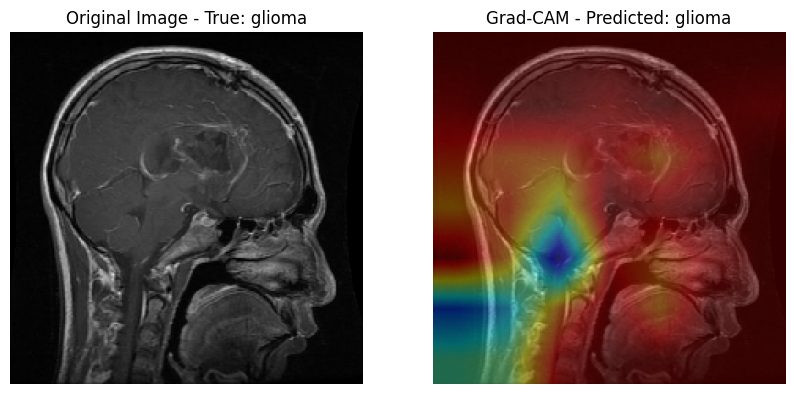

1/1 [==============================] - 0s 98ms/step


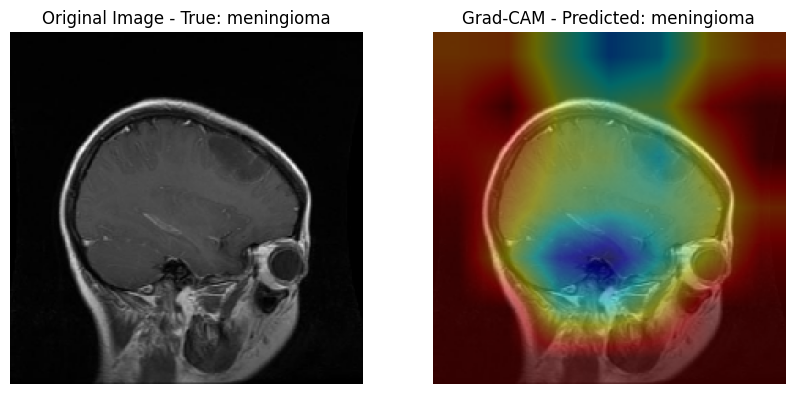


Generating Grad-CAM for class: meningioma

1/1 [==============================] - 0s 96ms/step


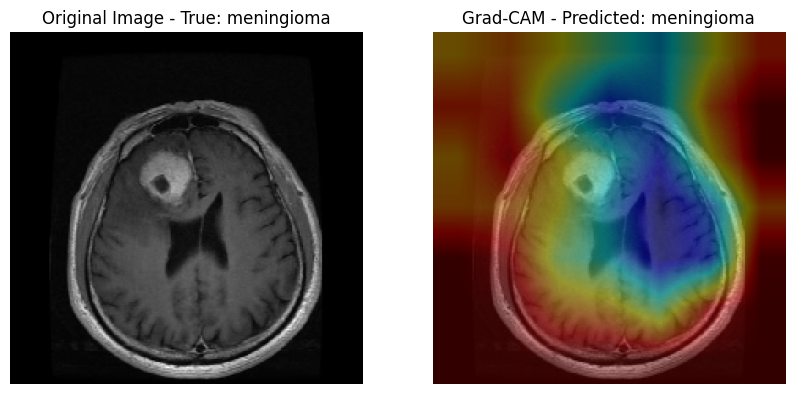

1/1 [==============================] - 0s 96ms/step


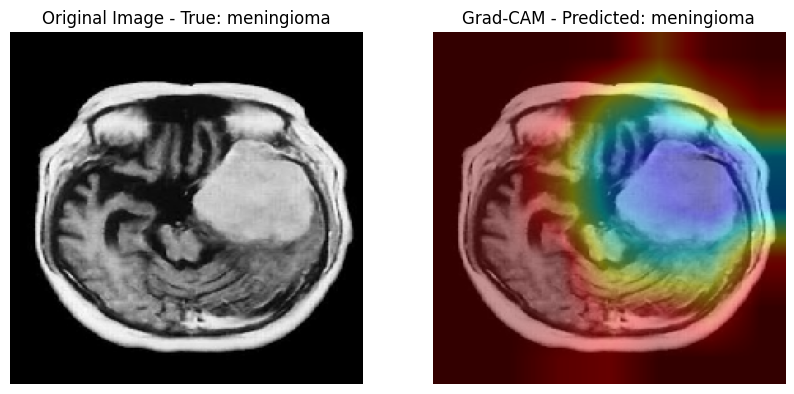

1/1 [==============================] - 0s 96ms/step


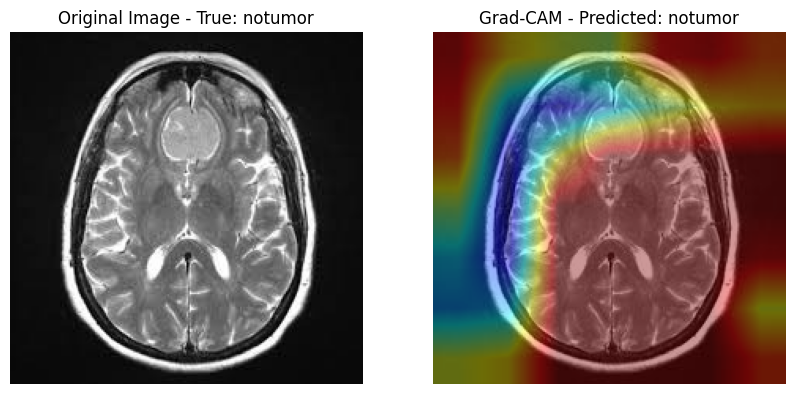


Generating Grad-CAM for class: notumor

1/1 [==============================] - 0s 97ms/step


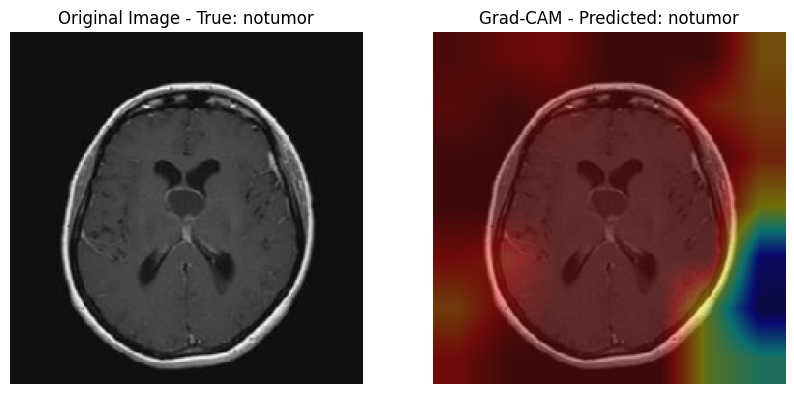

1/1 [==============================] - 0s 101ms/step


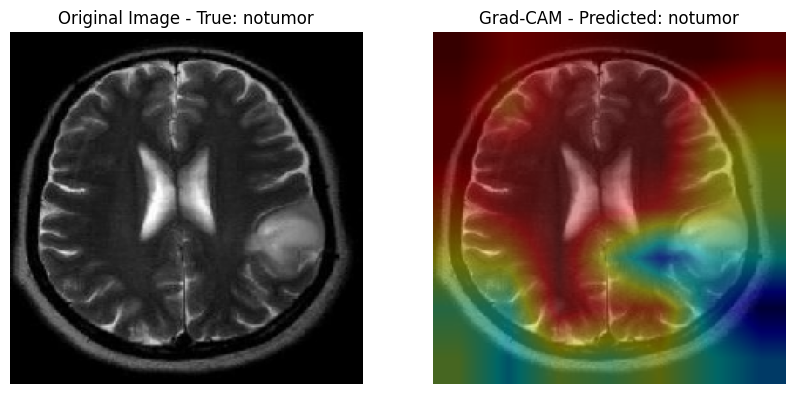

1/1 [==============================] - 0s 95ms/step


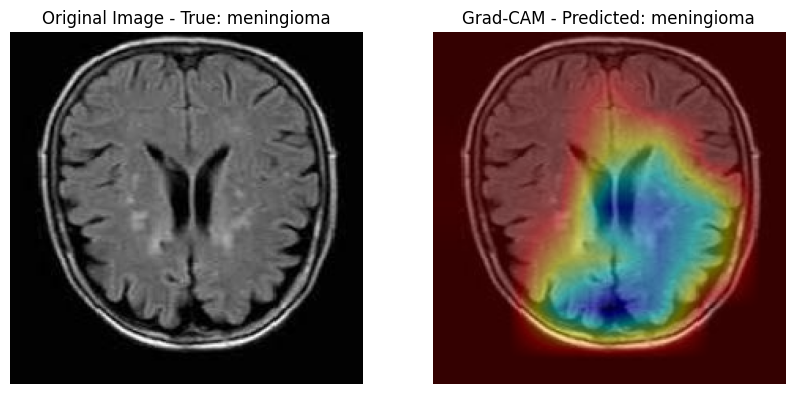


Generating Grad-CAM for class: pituitary

1/1 [==============================] - 0s 98ms/step


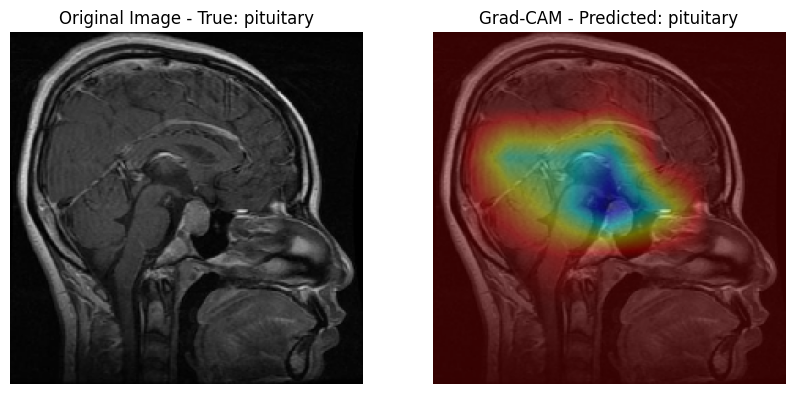

1/1 [==============================] - 0s 102ms/step


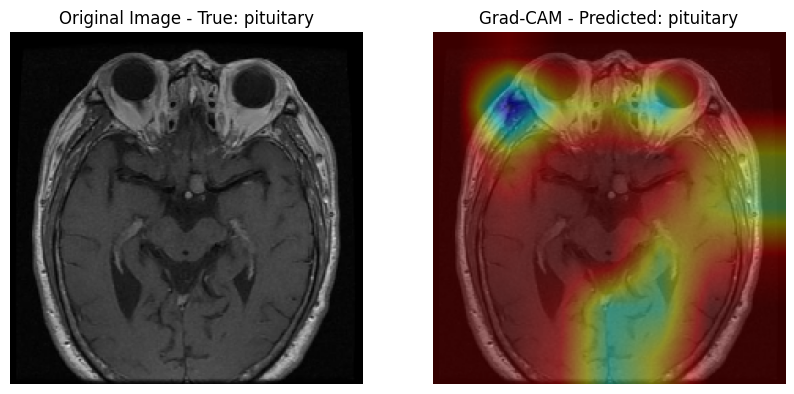

1/1 [==============================] - 0s 103ms/step


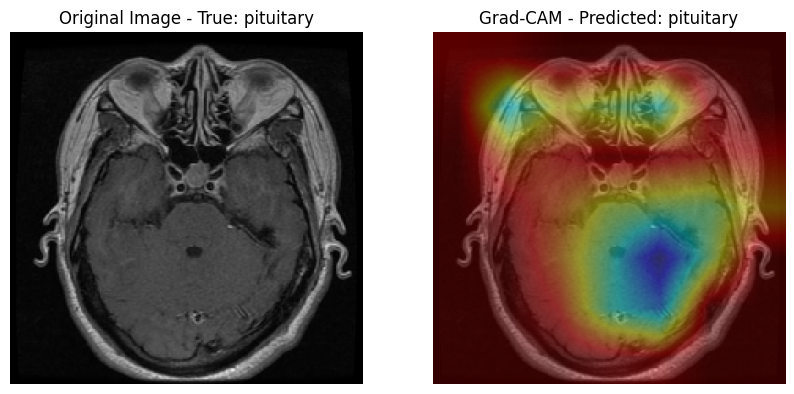

In [28]:
# Define the class labels for ResNet50
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Fetch images dynamically
sample_image_paths = fetch_images(base_path, 'Testing', class_labels)

# Function to generate Grad-CAM heatmap for the given ResNet50 model and image
def grad_cam(model, image, last_conv_layer_name, class_idx=None):
    """
    Generate Grad-CAM heatmap for a given model and image.
    """
    # Get the last convolutional layer
    grad_model = Model([model.input], [model.get_layer(last_conv_layer_name).output, model.output])

    # Expand image dimensions for processing
    image_expanded = np.expand_dims(image, axis=0)

    # Forward pass and compute gradients
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_expanded)
        if class_idx is None:
            class_idx = np.argmax(predictions[0])  # Use predicted class if none specified
        loss = predictions[:, class_idx]

    # Compute gradients of loss w.r.t. the convolutional layer output
    grads = tape.gradient(loss, conv_outputs)

    # Compute mean intensity of gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel by corresponding gradient intensity
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize heatmap values to [0, 1]
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Function to overlay heatmap on original image
def overlay_heatmap(image, heatmap, alpha=0.6, colormap=cv2.COLORMAP_JET):

    """
    Overlay heatmap on the original image.
    """
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, colormap)
    overlaid_image = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
    return overlaid_image

# Function to visualize Grad-CAM on images for ResNet50
def visualize_gradcam(img_path, model, class_labels, layer_name='conv5_block3_out'):
    """
    Generate Grad-CAM visualization for a single image.
    """
    # Load and preprocess the image
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array /= 255.0  # Normalize pixel values

    # Apply Grad-CAM
    heatmap = grad_cam(model, img_array, last_conv_layer_name=layer_name)

    # Overlay heatmap on the image
    img_rgb = (img_array * 255).astype(np.uint8)  # Convert to RGB format
    overlay_img = overlay_heatmap(img_rgb, heatmap)

    # Display the original image and overlayed image
    pred_class_idx = np.argmax(model.predict(np.expand_dims(img_array, axis=0)))
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title(f"Original Image - True: {class_labels[pred_class_idx]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay_img)
    plt.title(f"Grad-CAM - Predicted: {class_labels[pred_class_idx]}")
    plt.axis('off')
    plt.show()

# Loop through the fetched images and generate Grad-CAM visualizations
for label, paths in sample_image_paths.items():
    print(f"\nGenerating Grad-CAM for class: {label}\n")
    for img_path in paths:
        visualize_gradcam(img_path, resnet_model, class_labels, layer_name='conv5_block3_out')



In [29]:
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [30]:
def create_custom_cnn(input_shape):
    input_tensor = Input(shape=input_shape)

    # Block 1
    x = Conv2D(64, (3, 3), padding='same', activation='relu')(input_tensor)
    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)

    # Block 2
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)

    # Block 3
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = MaxPooling2D((2, 2))(x)
    x = BatchNormalization()(x)

    # Fully Connected Layers
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    output_tensor = Dense(len(labels), activation='softmax')(x)

    model = Model(inputs=input_tensor, outputs=output_tensor)
    return model

# Create the model
input_shape = (image_size, image_size, 3)
custom_cnn = create_custom_cnn(input_shape)

custom_cnn.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Recall(name='recall')]
)

custom_cnn.summary()

Model: "model_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 batch_normalization_1 (Bat  (None, 112, 112, 64)      256       
 chNormalization)                                                
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     738

In [31]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7),
    EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True),
    ModelCheckpoint(f'{save_dir}/best_custom_cnn_model.h5', monitor='val_loss', save_best_only=True)
]

In [32]:
class_weights = {
    0: 1.0,  # glioma
    1: 2.0,  # meningioma
    2: 1.0,  # no tumor
    3: 1.2   # pituitary
}

history_custom = custom_cnn.fit(
    datagen.flow(x_train_final, y_train_final, batch_size=32),
    validation_data=(x_val, y_val),
    epochs=40,
    callbacks=callbacks,
    class_weight=class_weights
)

# Save the model
custom_cnn.save(f'{save_dir}/custom_cnn_model.h5')
print(f"Custom CNN Model saved to {save_dir}/custom_cnn_model.h5")

Epoch 1/40
50/50 [==============================] - ETA: 0s - loss: 3.7102 - accuracy: 0.4581 - recall: 0.4225

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


50/50 [==============================] - 177s 3s/step - loss: 3.7102 - accuracy: 0.4581 - recall: 0.4225 - val_loss: 2.1163 - val_accuracy: 0.3400 - val_recall: 0.0000e+00 - lr: 1.0000e-04
Epoch 2/40
50/50 [==============================] - 171s 3s/step - loss: 1.5487 - accuracy: 0.5113 - recall: 0.3938 - val_loss: 2.5500 - val_accuracy: 0.2275 - val_recall: 0.2275 - lr: 1.0000e-04
Epoch 3/40
50/50 [==============================] - 171s 3s/step - loss: 1.4001 - accuracy: 0.5506 - recall: 0.4406 - val_loss: 2.9055 - val_accuracy: 0.2275 - val_recall: 0.2275 - lr: 1.0000e-04
Epoch 4/40
50/50 [==============================] - 171s 3s/step - loss: 1.3574 - accuracy: 0.5369 - recall: 0.3913 - val_loss: 2.7907 - val_accuracy: 0.2275 - val_recall: 0.2275 - lr: 1.0000e-04
Epoch 5/40
50/50 [==============================] - 171s 3s/step - loss: 1.2273 - accuracy: 0.5819 - recall: 0.4538 - val_loss: 2.2765 - val_accuracy: 0.2275 - val_recall: 0.2250 - lr: 5.0000e-05
Epoch 6/40
50/50 [=========

Custom CNN Model saved to /content/drive/MyDrive/project/brain tumor/custom_cnn_model.h5


In [33]:
# Define the path to the saved Custom CNN model
model_path = '/content/drive/MyDrive/project/brain tumor/custom_cnn_model.h5'

# Load the model
custom_cnn = load_model(model_path)
print("Custom CNN model loaded successfully!")

Custom CNN model loaded successfully!


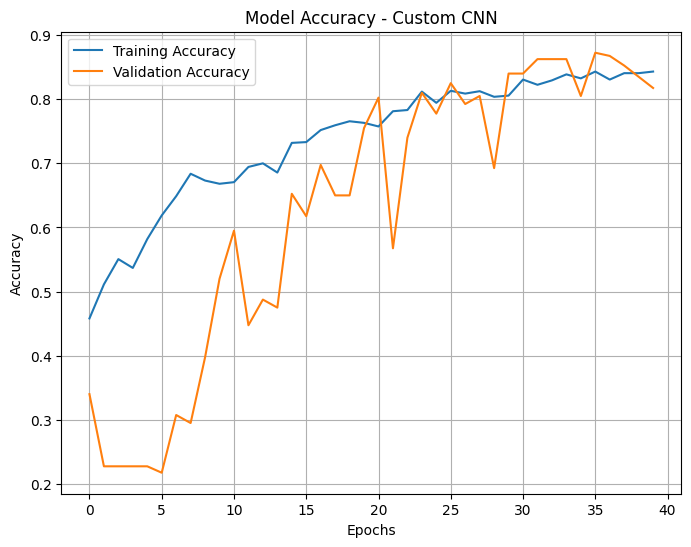

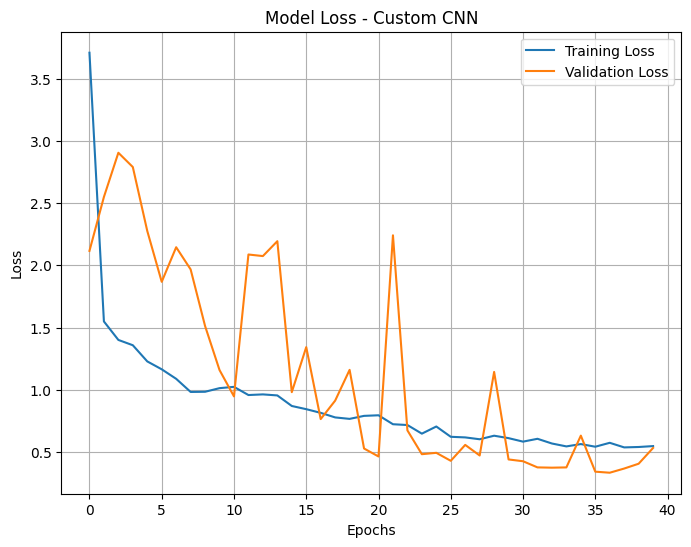

In [35]:
# Plotting Training and Validation Accuracy
plt.figure(figsize=(8, 6))
plt.plot(history_custom.history['accuracy'], label='Training Accuracy')
plt.plot(history_custom.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy - Custom CNN')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plotting Training and Validation Loss
plt.figure(figsize=(8, 6))
plt.plot(history_custom.history['loss'], label='Training Loss')
plt.plot(history_custom.history['val_loss'], label='Validation Loss')
plt.title('Model Loss - Custom CNN')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()



50/50 [==============================] - 21s 412ms/step


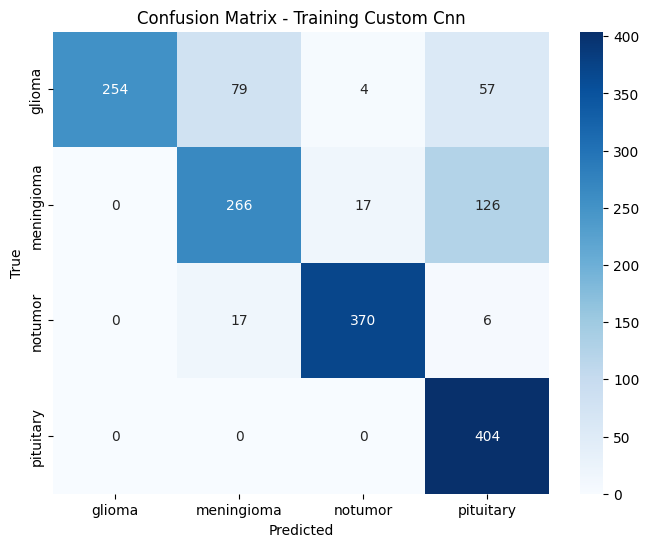

In [36]:
# Get predictions for the training set
y_train_pred = custom_cnn.predict(x_train_final)
y_train_pred_classes = y_train_pred.argmax(axis=1)
y_train_true_classes = y_train_final.argmax(axis=1)

# Generate the confusion matrix
cm_train = confusion_matrix(y_train_true_classes, y_train_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix - Training Custom Cnn")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

41/41 [==============================] - 17s 407ms/step
Classification Report:
               precision    recall  f1-score   support

      glioma       0.99      0.55      0.71       300
  meningioma       0.64      0.60      0.62       306
     notumor       0.89      0.90      0.89       405
   pituitary       0.67      1.00      0.80       300

    accuracy                           0.77      1311
   macro avg       0.80      0.76      0.76      1311
weighted avg       0.80      0.77      0.77      1311



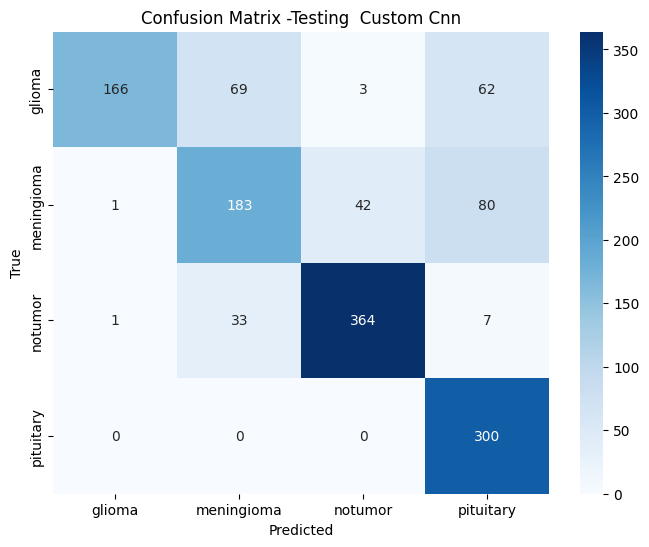

In [37]:
y_pred_custom = np.argmax(custom_cnn.predict(x_test), axis=1)
y_true_custom = np.argmax(y_test, axis=1)

print("Classification Report:\n", classification_report(y_true_custom, y_pred_custom, target_names=labels))

cm_custom = confusion_matrix(y_true_custom, y_pred_custom)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_custom, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix -Testing  Custom Cnn")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

41/41 [==============================] - 22s 546ms/step


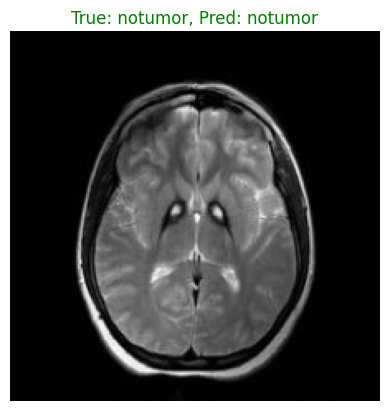

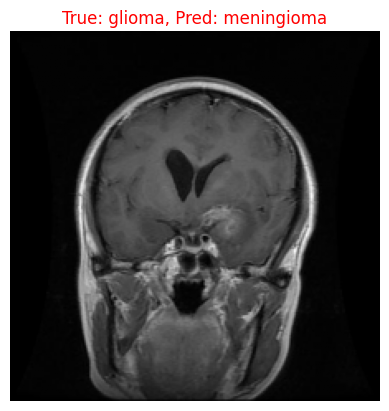

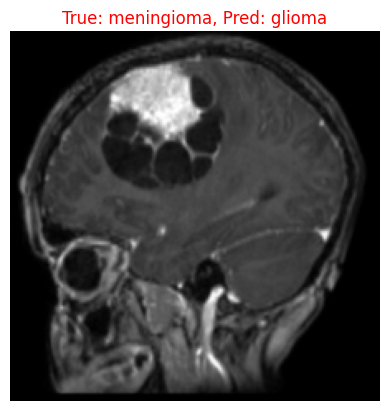

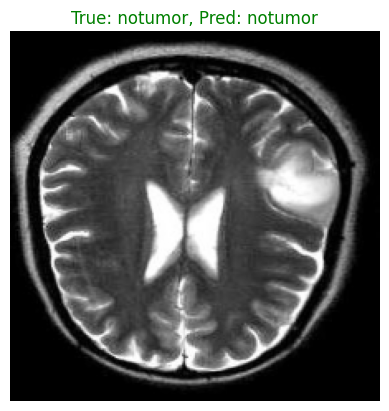

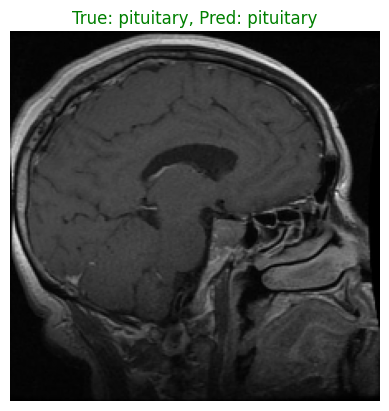

In [38]:
# Get predictions for the test set
resnet_predictions = np.argmax(resnet_model.predict(x_test), axis=1)  # Predictions for x_test

# Display 5 random images with true and predicted labels
for i in range(5):
    idx = random.randint(0, len(x_test) - 1)  # Select a random index
    plt.imshow(x_test[idx])  # Display the image

    # Correct the true label reference
    true_label = labels[np.argmax(y_test[idx])]  # Replace y_test_classification with y_test

    predicted_label = labels[resnet_predictions[idx]]  # Predicted label
    color = 'green' if true_label == predicted_label else 'red'  # Correct = green, Incorrect = red

    plt.title(f"True: {true_label}, Pred: {predicted_label}", color=color)
    plt.axis('off')  # Hide axes
    plt.show()  # Display the image


Last convolutional layer: conv2d_5

Generating Grad-CAM for class: glioma

1/1 [==============================] - 0s 104ms/step


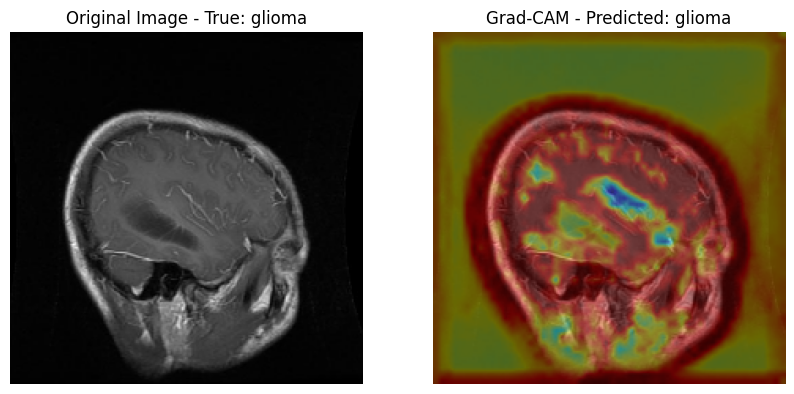

1/1 [==============================] - 0s 96ms/step


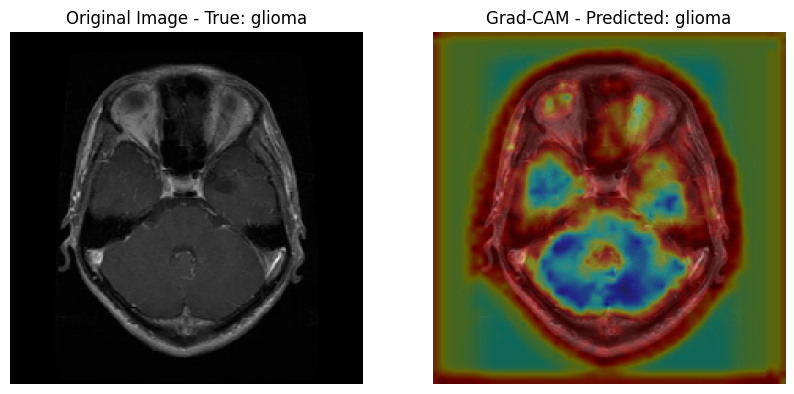

1/1 [==============================] - 0s 105ms/step


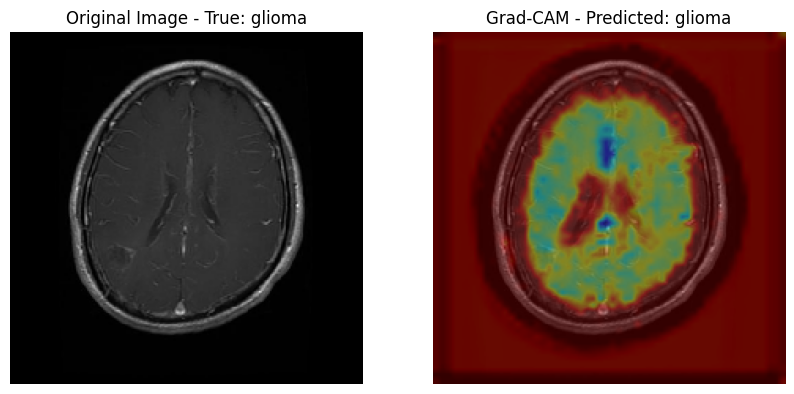


Generating Grad-CAM for class: meningioma

1/1 [==============================] - 0s 102ms/step


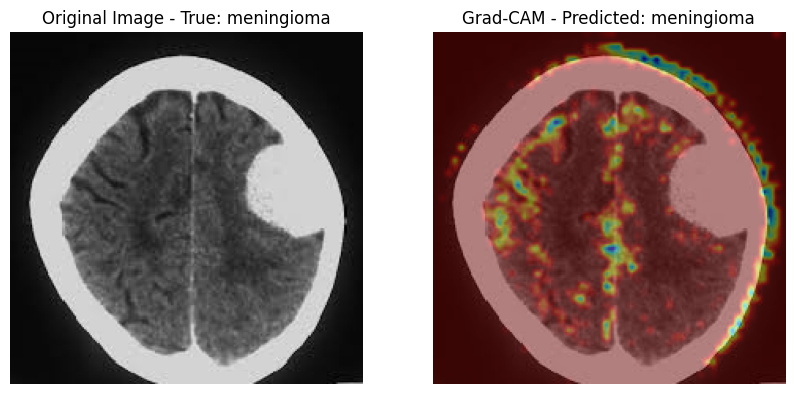

1/1 [==============================] - 0s 96ms/step


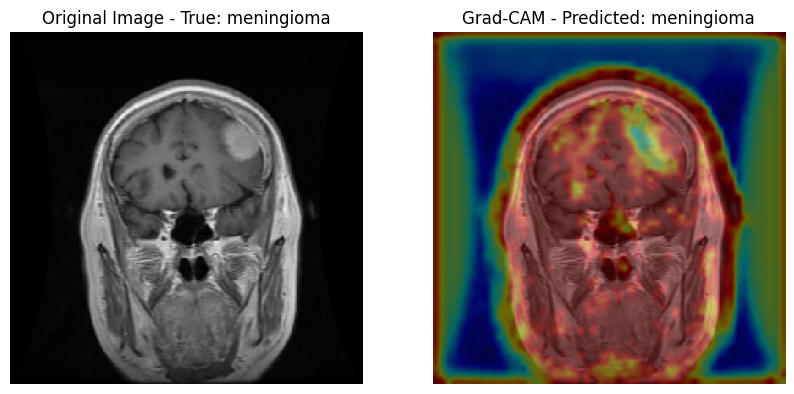

1/1 [==============================] - 0s 94ms/step


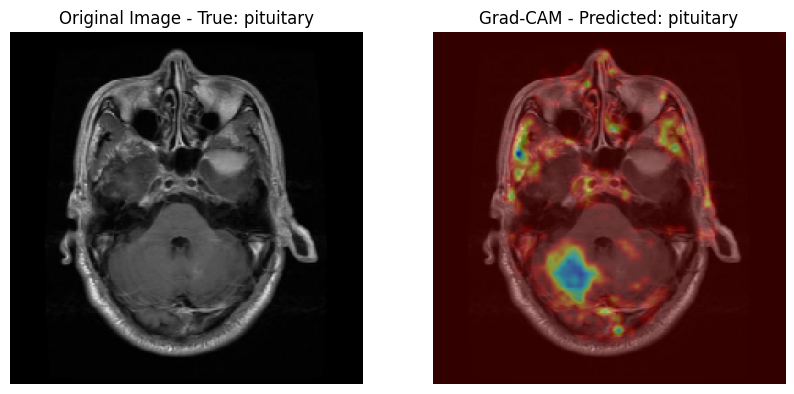


Generating Grad-CAM for class: notumor

1/1 [==============================] - 0s 97ms/step


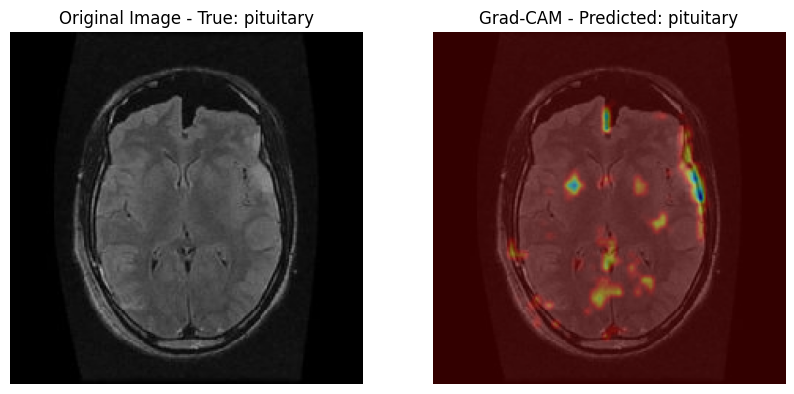

1/1 [==============================] - 0s 101ms/step


<ipython-input-39-8b6a79654f0c>:37: RuntimeWarning: invalid value encountered in divide
  heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
<ipython-input-39-8b6a79654f0c>:46: RuntimeWarning: invalid value encountered in cast
  heatmap = np.uint8(255 * heatmap)


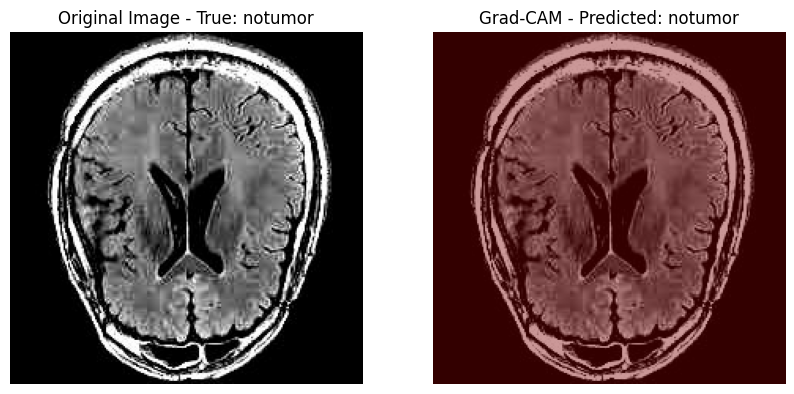

1/1 [==============================] - 0s 101ms/step


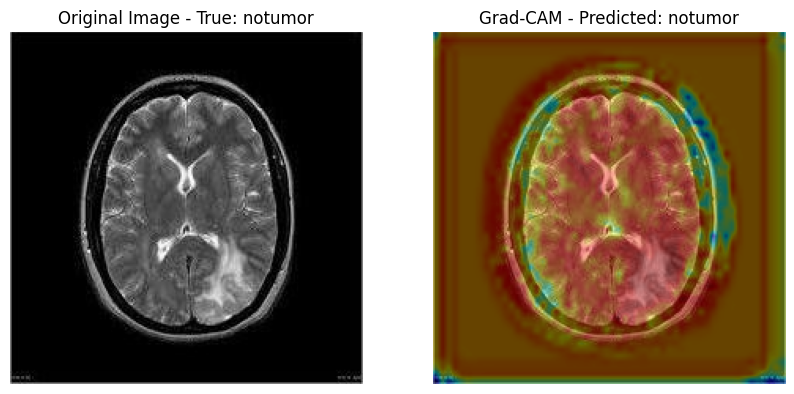


Generating Grad-CAM for class: pituitary

1/1 [==============================] - 0s 102ms/step


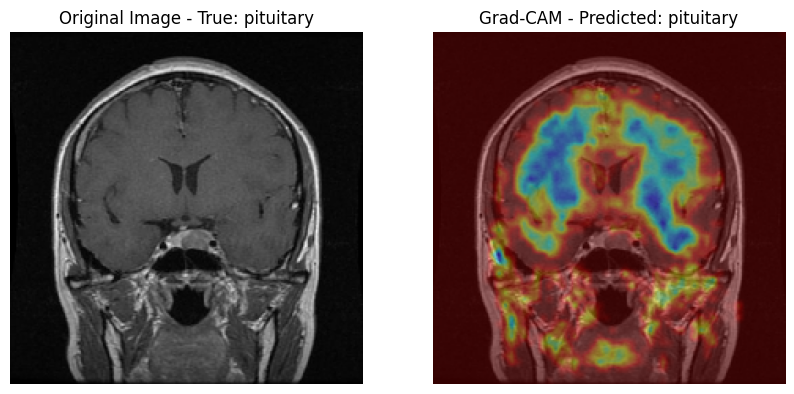

1/1 [==============================] - 0s 97ms/step


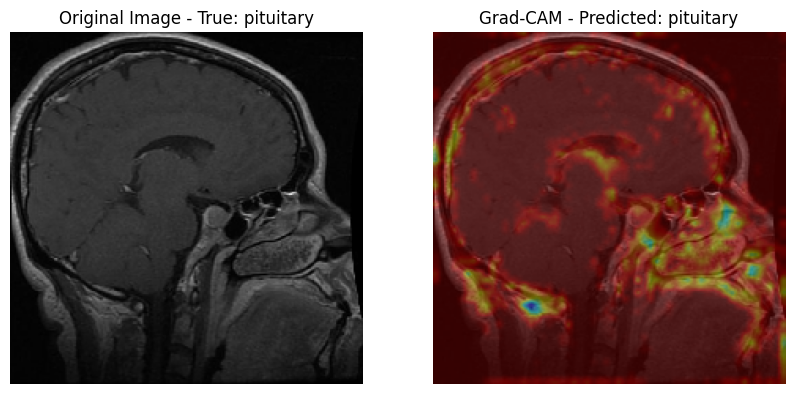

1/1 [==============================] - 0s 99ms/step


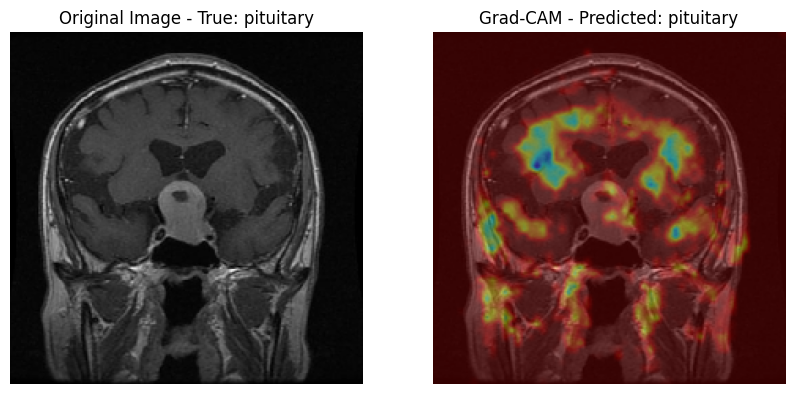

In [39]:
# Define the class labels for Custom CNN (same as ResNet50 and VGG16)
class_labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

# Fetch images dynamically
sample_image_paths = fetch_images(base_path, 'Testing', class_labels)

# Function to generate Grad-CAM heatmap for the given Custom CNN model and image
def grad_cam(model, image, last_conv_layer_name, class_idx=None):
    """
    Generate Grad-CAM heatmap for a given model and image.
    """
    # Get the last convolutional layer
    grad_model = Model([model.input], [model.get_layer(last_conv_layer_name).output, model.output])

    # Expand image dimensions for processing
    image_expanded = np.expand_dims(image, axis=0)

    # Forward pass and compute gradients
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(image_expanded)
        if class_idx is None:
            class_idx = np.argmax(predictions[0])  # Use predicted class if none specified
        loss = predictions[:, class_idx]

    # Compute gradients of loss w.r.t. the convolutional layer output
    grads = tape.gradient(loss, conv_outputs)

    # Compute mean intensity of gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply each channel by corresponding gradient intensity
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize heatmap values to [0, 1]
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

# Function to overlay heatmap on original image
def overlay_heatmap(image, heatmap, alpha=0.6, colormap=cv2.COLORMAP_JET):
    """
    Overlay heatmap on the original image.
    """
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, colormap)
    overlaid_image = cv2.addWeighted(image, alpha, heatmap, 1 - alpha, 0)
    return overlaid_image

# Dynamically fetch the name of the last convolutional layer
def get_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, Conv2D):
            return layer.name
    raise ValueError("No convolutional layers found in the model.")

# Get the last convolutional layer for Grad-CAM
last_conv_layer_name = get_last_conv_layer(custom_cnn)
print(f"Last convolutional layer: {last_conv_layer_name}")

# Function to visualize Grad-CAM on images for Custom CNN
def visualize_gradcam(img_path, model, class_labels, layer_name):
    """
    Generate Grad-CAM visualization for a single image.
    """
    # Load and preprocess the image
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array /= 255.0  # Normalize pixel values

    # Apply Grad-CAM
    heatmap = grad_cam(model, img_array, last_conv_layer_name=layer_name)

    # Overlay heatmap on the image
    img_rgb = (img_array * 255).astype(np.uint8)  # Convert to RGB format
    overlay_img = overlay_heatmap(img_rgb, heatmap)

    # Display the original image and overlayed image
    pred_class_idx = np.argmax(model.predict(np.expand_dims(img_array, axis=0)))
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title(f"Original Image - True: {class_labels[pred_class_idx]}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay_img)
    plt.title(f"Grad-CAM - Predicted: {class_labels[pred_class_idx]}")
    plt.axis('off')
    plt.show()

# Loop through the fetched images and generate Grad-CAM visualizations for Custom CNN
for label, paths in sample_image_paths.items():
    print(f"\nGenerating Grad-CAM for class: {label}\n")
    for img_path in paths:
        visualize_gradcam(img_path, custom_cnn, class_labels, layer_name=last_conv_layer_name)





In [40]:
# Load saved models from Google Drive or local directory
vgg_model = load_model('/content/drive/MyDrive/project/brain tumor/vgg_model.h5')
resnet_model = load_model('/content/drive/MyDrive/project/brain tumor/resnet_model.h5')
custom_cnn = load_model('/content/drive/MyDrive/project/brain tumor/custom_cnn_model.h5')

# Set model weights based on performance
weights = [0.50, 0.30, 0.20]  # VGG16, ResNet50, Custom CNN

# Get predicted probabilities for each model
vgg_probs = vgg_model.predict(x_test)
resnet_probs = resnet_model.predict(x_test)
custom_probs = custom_cnn.predict(x_test)

# Calculate weighted average of probabilities
ensemble_probs = (vgg_probs * weights[0]) + (resnet_probs * weights[1]) + (custom_probs * weights[2])

# Final predictions by selecting the class with the highest probability
ensemble_preds = np.argmax(ensemble_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

# Evaluate Performance
accuracy = accuracy_score(y_true, ensemble_preds)
precision = precision_score(y_true, ensemble_preds, average='weighted')
recall = recall_score(y_true, ensemble_preds, average='weighted')
f1 = f1_score(y_true, ensemble_preds, average='weighted')

print(f"\nWeighted Voting Ensemble Results:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1:.4f}")


41/41 [==============================] - 16s 397ms/step

Weighted Voting Ensemble Results:
Accuracy: 0.9367
Precision: 0.9381
Recall: 0.9367
F1-Score: 0.9358



Classification Report (Weighted Ensemble):

              precision    recall  f1-score   support

      glioma       0.99      0.88      0.93       300
  meningioma       0.92      0.86      0.89       306
     notumor       0.93      1.00      0.96       405
   pituitary       0.92      0.99      0.95       300

    accuracy                           0.94      1311
   macro avg       0.94      0.93      0.93      1311
weighted avg       0.94      0.94      0.94      1311



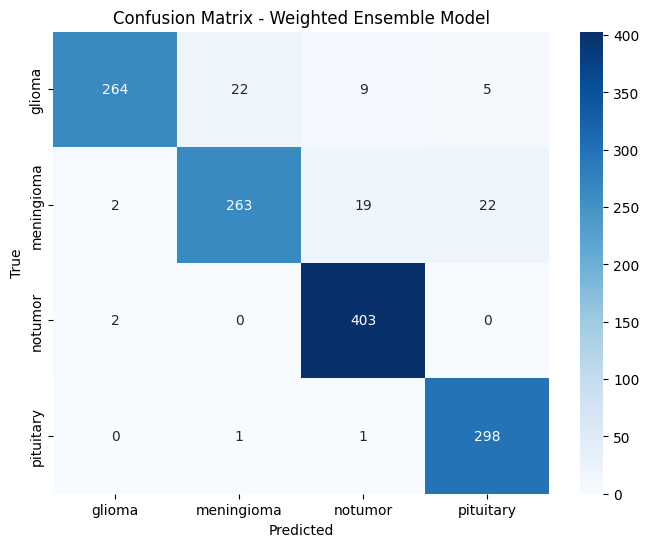

In [41]:
# Classification Report
print("\nClassification Report (Weighted Ensemble):\n")
print(classification_report(y_true, ensemble_preds, target_names=labels))

# Confusion Matrix
cm = confusion_matrix(y_true, ensemble_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title("Confusion Matrix - Weighted Ensemble Model")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

                        Model  Accuracy  Precision   Recall  F1-Score
0  Ensemble (Weighted Voting)   0.93669   0.938065  0.93669  0.935803


<Figure size 1000x600 with 0 Axes>

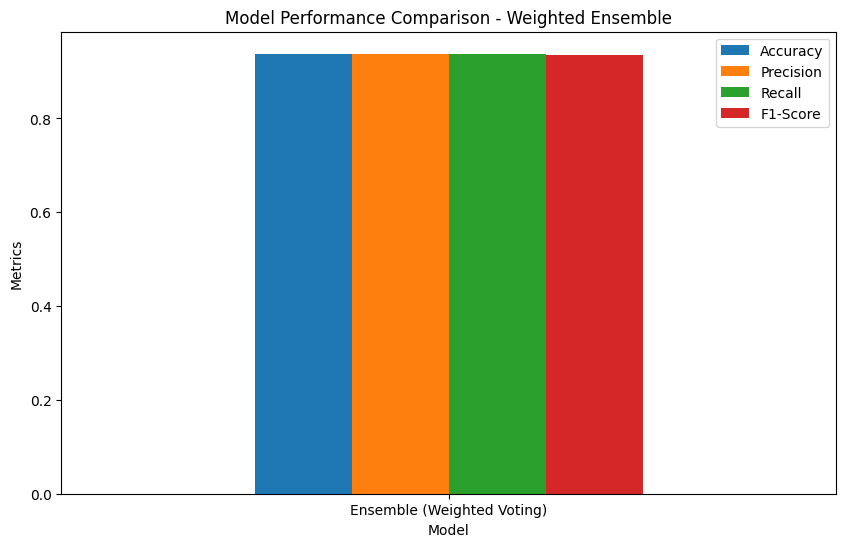

In [42]:
# Store Results for Comparison
results = []
results.append({'Model': 'Ensemble (Weighted Voting)',
                'Accuracy': accuracy,
                'Precision': precision,
                'Recall': recall,
                'F1-Score': f1})

# Convert Results to DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# Visualize the Results
plt.figure(figsize=(10, 6))
results_df.set_index('Model').plot(kind='bar', figsize=(10, 6))
plt.title("Model Performance Comparison - Weighted Ensemble")
plt.ylabel("Metrics")
plt.xticks(rotation=0)
plt.legend(loc="best")
plt.show()